In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import statsmodels.api as sm
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import OneHotEncoder as OHE
from sklearn.compose import ColumnTransformer as CTF
from sklearn.pipeline import Pipeline
sns.set()

In [2]:
raw_data = pd.read_csv('new_track_data.csv')

In [3]:
raw_data.head()

,Id,count,ad_type,device_os,pincode,district,statename,impression,start,first_quartile,mid_point,third_quartile,complete,creative_view,click
0,118700032,7,audio,iOs,131001.0,SONIPAT,Haryana,1,1,1,1,1,1,1,0
1,118700033,7,audio,iOs,131101.0,SONIPAT,Haryana,1,1,1,1,1,1,1,0
2,118699513,49,video,Android,600046.0,KANCHIPURAM,Tamil Nadu,7,7,7,6,6,6,7,0
3,118699153,1,video,Android,110016.0,SOUTH DELHI,Delhi,0,0,0,0,0,0,0,0
4,118699154,158,video,Android,110017.0,SOUTH DELHI,Delhi,22,22,22,19,19,19,22,0


In [4]:
# We want to predict the LTR depending on the various features 
# Dependent Variable (Target): LTR
# Independent Variable (input): Complete, district, ad_type="AUDIO", device_os

In [4]:
raw_data['pincode'] = raw_data['pincode'].astype('Int64')
raw_data['pincode'] = raw_data['pincode'].astype('object')
data = raw_data.drop(['count', 'start', 'first_quartile','mid_point','third_quartile','creative_view'],axis=1)

In [36]:
# District & Ad_type, Device Os
data['ad_type'] = data['ad_type'].str.upper()
data['device_os'] = data['device_os'].str.upper()
ctr_data = data.groupby(['district','ad_type','device_os']).agg({'impression': 'sum','complete': 'sum', 'click': 'sum'}).reset_index()
ctr_data['CTR'] = ctr_data['click'] / ctr_data['impression']
ctr_data['LTR'] = ctr_data['complete'] / ctr_data['impression']
filtered_data = ctr_data[~ctr_data['CTR'].isna() & np.isfinite(ctr_data['CTR']) & (ctr_data['CTR'] > 0) & (ctr_data['CTR'] < 1) & (ctr_data['ad_type'] != 'VIDEO') & (ctr_data['ad_type'] != 'DISPLAY') & (ctr_data['LTR'] < 1) & (ctr_data['LTR'] > 0) ]
filtered_data.index = np.arange(1, len(filtered_data) + 1)
filtered_data = filtered_data.drop('ad_type', axis=1)
print(filtered_data)

                district device_os  impression  complete  click       CTR  \
1               ADILABAD   ANDROID         129       127      1  0.007752   
2                   AGRA   ANDROID        4727      4344     49  0.010366   
3            AHMED NAGAR   ANDROID         619       563      3  0.004847   
4              AHMEDABAD   ANDROID       92016     75850   1606  0.017453   
5              AHMEDABAD       IOS        3403      2639     31  0.009110   
6                  AJMER   ANDROID        1705      1338     33  0.019355   
7              ALAPPUZHA   ANDROID         247       241      1  0.004049   
8                ALIGARH   ANDROID         152       124      5  0.032895   
9              ALLAHABAD   ANDROID        3148      2896     30  0.009530   
10                ALMORA   ANDROID         111        88      1  0.009009   
11                 ALWAR   ANDROID         534       458      4  0.007491   
12                 ALWAR       IOS         747       658      2  0.002677   

In [6]:
pd.set_option('display.max_rows',774)

In [7]:
filtered_data.describe(include='all')

,district,device_os,impression,complete,click,CTR,LTR
count,515,515,515.000000,515.000000,515.000000,515.000000,515.000000
unique,412,3,NaN,NaN,NaN,NaN,NaN
top,NORTH EAST DELHI,ANDROID,NaN,NaN,NaN,NaN,NaN
freq,3,409,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,4482.943689,3994.856311,46.623301,0.016182,0.882369
std,NaN,NaN,16718.703001,14824.886422,199.223868,0.025455,0.081419
min,NaN,NaN,4.000000,2.000000,1.000000,0.000546,0.351351
25%,NaN,NaN,209.000000,184.000000,2.000000,0.004772,0.842931
50%,NaN,NaN,554.000000,499.000000,4.000000,0.009146,0.894872
75%,NaN,NaN,1832.000000,1653.000000,12.500000,0.016671,0.943582


C:\Users\NIGHAT\AppData\Local\Temp\ipykernel_21996\688673175.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(filtered_data['CTR'])


<Axes: xlabel='CTR', ylabel='Density'>

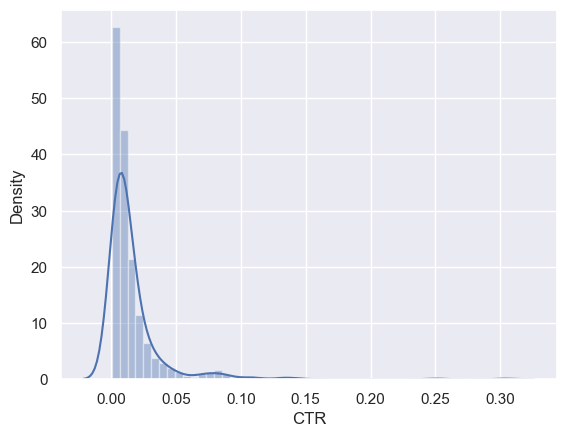

In [10]:
sns.distplot(filtered_data['CTR'])

C:\Users\NIGHAT\AppData\Local\Temp\ipykernel_21996\801377788.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(filtered_data['LTR'])


<Axes: xlabel='LTR', ylabel='Density'>

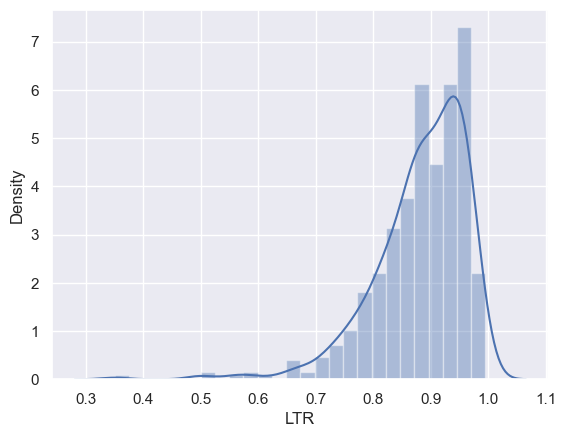

In [11]:
sns.distplot(filtered_data['LTR'])

C:\Users\NIGHAT\AppData\Local\Temp\ipykernel_21996\86936268.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(filtered_data['click'])


<Axes: xlabel='click', ylabel='Density'>

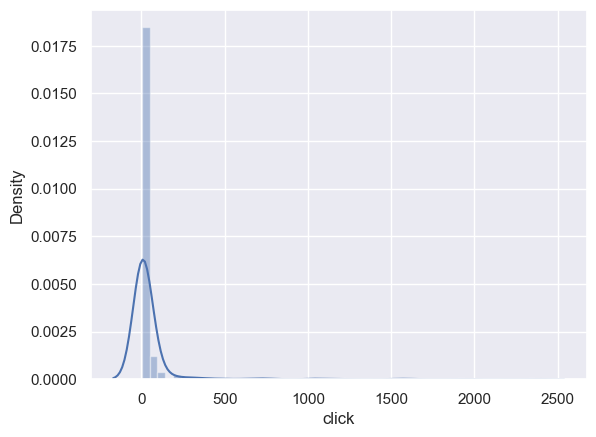

In [12]:
sns.distplot(filtered_data['click'])

C:\Users\NIGHAT\AppData\Local\Temp\ipykernel_21996\4055388586.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(filtered_data['impression'])


<Axes: xlabel='impression', ylabel='Density'>

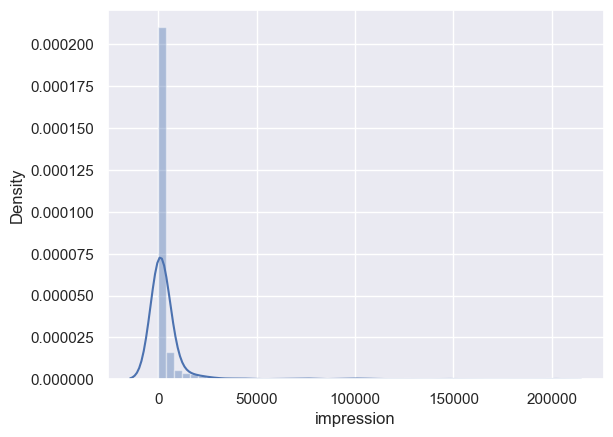

In [13]:
sns.distplot(filtered_data['impression'])

C:\Users\NIGHAT\AppData\Local\Temp\ipykernel_21996\3241697512.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(filtered_data['complete'])


<Axes: xlabel='complete', ylabel='Density'>

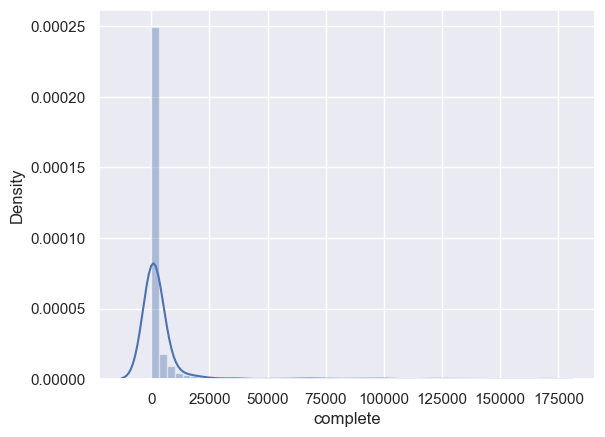

In [14]:
sns.distplot(filtered_data['complete'])

In [56]:
#to remove outliers by using quantile
q1= filtered_data['CTR'].quantile(0.99)
data_outlierNA = filtered_data[filtered_data['CTR'] < q1]

In [57]:
#to remove outliers by using quantile
q1= filtered_data['LTR'].quantile(0.01)
data_outlierNA = filtered_data[filtered_data['LTR'] > q1]

In [58]:
#to remove outliers by using quantile
q1= filtered_data['click'].quantile(0.99)
data_outlierNA = filtered_data[filtered_data['click'] < q1]

In [59]:
#to remove outliers by using quantile
q1= filtered_data['impression'].quantile(0.99)
data_outlierNA = filtered_data[filtered_data['impression'] < q1]

In [60]:
#to remove outliers by using quantile
q1= filtered_data['complete'].quantile(0.99)
data_outlierNA = filtered_data[filtered_data['complete'] < q1]

In [61]:
data_outlierNA.describe(include='all')

,district,device_os,impression,complete,click,CTR,LTR
count,509,509,509.000000,509.000000,509.000000,509.000000,509.000000
unique,412,3,NaN,NaN,NaN,NaN,NaN
top,SRINAGAR,ANDROID,NaN,NaN,NaN,NaN,NaN
freq,3,403,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,3000.072692,2657.954813,30.905697,0.016250,0.882054
std,NaN,NaN,8887.491036,7742.411334,119.875522,0.025595,0.081664
min,NaN,NaN,4.000000,2.000000,1.000000,0.000546,0.351351
25%,NaN,NaN,207.000000,182.000000,2.000000,0.004662,0.842551
50%,NaN,NaN,541.000000,494.000000,4.000000,0.009132,0.894872
75%,NaN,NaN,1791.000000,1601.000000,12.000000,0.016682,0.943503


## Checking The OLS Assumption

Text(0.5, 1.0, 'CTR & Click')

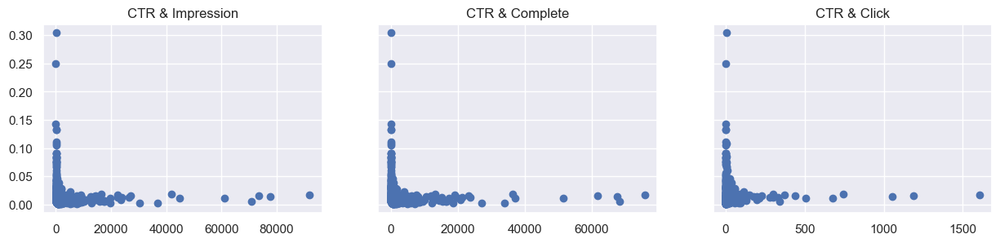

In [14]:
# Scatter plot for CTR against impression, complete, click
f,(ax1,ax2,ax3) = plt.subplots(1,3, sharey=True, figsize=(15,3))
ax1.scatter(data_outlierNA['impression'], data_outlierNA['CTR'])
ax1.set_title('CTR & Impression')
ax2.scatter(data_outlierNA['complete'], data_outlierNA['CTR'])
ax2.set_title('CTR & Complete')
ax3.scatter(data_outlierNA['click'], data_outlierNA['CTR'])
ax3.set_title('CTR & Click')

Text(0.5, 1.0, 'LTR & Click')

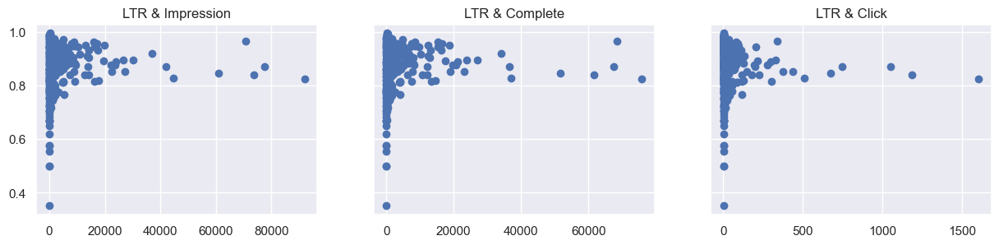

In [15]:
# Scatter plot for LTR against impression, complete, click
f,(ax1,ax2,ax3) = plt.subplots(1,3, sharey=True, figsize=(15,3))
ax1.scatter(data_outlierNA['impression'], data_outlierNA['LTR'])
ax1.set_title('LTR & Impression')
ax2.scatter(data_outlierNA['complete'], data_outlierNA['LTR'])
ax2.set_title('LTR & Complete')
ax3.scatter(data_outlierNA['click'], data_outlierNA['LTR'])
ax3.set_title('LTR & Click')

In [16]:
#Correlation between CTR and Impression
from scipy.stats import pearsonr
correlation_coefficient, p_value = pearsonr(data_outlierNA['impression'], data_outlierNA['CTR'])
print(f"Pearson correlation coefficient: {correlation_coefficient}")
print(f"P-value: {p_value}")

Pearson correlation coefficient: -0.07861105982794442
P-value: 0.07640636875474449


In [17]:
#Correlation between CTR and complete
from scipy.stats import pearsonr
correlation_coefficient, p_value = pearsonr(data_outlierNA['complete'], data_outlierNA['CTR'])
print(f"Pearson correlation coefficient: {correlation_coefficient}")
print(f"P-value: {p_value}")

Pearson correlation coefficient: -0.0828562404220206
P-value: 0.061770572007303806


In [18]:
#Correlation between CTR and click
from scipy.stats import pearsonr
correlation_coefficient, p_value = pearsonr(data_outlierNA['click'], data_outlierNA['CTR'])
print(f"Pearson correlation coefficient: {correlation_coefficient}")
print(f"P-value: {p_value}")

Pearson correlation coefficient: -0.023903555345546924
P-value: 0.5905495792099631


In [19]:
#Correlation between LTR and Impression
from scipy.stats import pearsonr
correlation_coefficient, p_value = pearsonr(data_outlierNA['impression'], data_outlierNA['LTR'])
print(f"Pearson correlation coefficient: {correlation_coefficient}")
print(f"P-value: {p_value}")

Pearson correlation coefficient: 0.016193378439232145
P-value: 0.7155108390148995


In [20]:
#Correlation between LTR and complete
from scipy.stats import pearsonr
correlation_coefficient, p_value = pearsonr(data_outlierNA['complete'], data_outlierNA['LTR'])
print(f"Pearson correlation coefficient: {correlation_coefficient}")
print(f"P-value: {p_value}")

Pearson correlation coefficient: 0.028137303215419917
P-value: 0.5264912764284412


In [21]:
#Correlation between LTR and click
from scipy.stats import pearsonr
correlation_coefficient, p_value = pearsonr(data_outlierNA['click'], data_outlierNA['LTR'])
print(f"Pearson correlation coefficient: {correlation_coefficient}")
print(f"P-value: {p_value}")

Pearson correlation coefficient: -0.04652184164828242
P-value: 0.29483797570453957


In [22]:
#Correlation between click and Impression
from scipy.stats import pearsonr
correlation_coefficient, p_value = pearsonr(data_outlierNA['impression'], data_outlierNA['click'])
print(f"Pearson correlation coefficient: {correlation_coefficient}")
print(f"P-value: {p_value}")

Pearson correlation coefficient: 0.9200034359113094
P-value: 2.1424933471731364e-208


In [23]:
#Correlation between complete and Impression
from scipy.stats import pearsonr
correlation_coefficient, p_value = pearsonr(data_outlierNA['impression'], data_outlierNA['complete'])
print(f"Pearson correlation coefficient: {correlation_coefficient}")
print(f"P-value: {p_value}")

Pearson correlation coefficient: 0.998337769850251
P-value: 0.0


In [24]:
#Dependent Variables: click for CTR and complete for LTR
#Independent Variables: Impression, district

## Checking The OLS Assumptions For complete and click

Text(0.5, 1.0, 'complete & Impression')

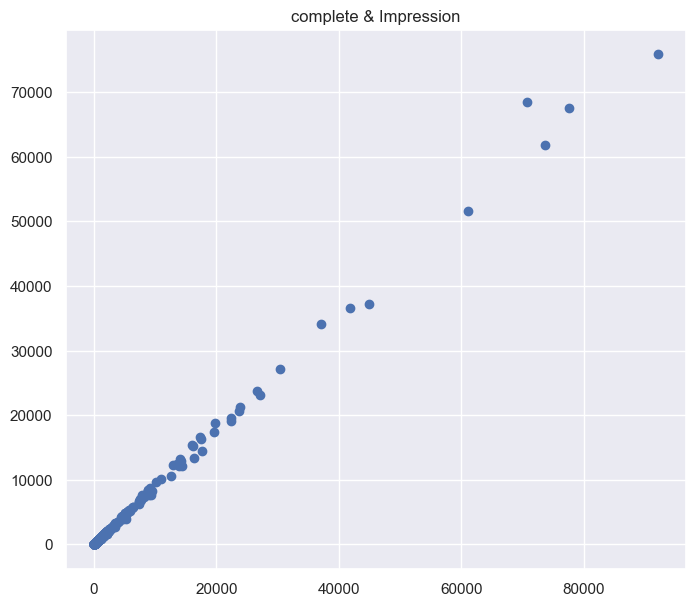

In [25]:
#Scatter Plot for Completions 
f,(ax1) = plt.subplots(1,1, sharey=True, figsize=(8,7))
ax1.scatter(data_outlierNA['impression'], data_outlierNA['complete'])
ax1.set_title('complete & Impression')

Text(0.5, 1.0, 'click & Complete')

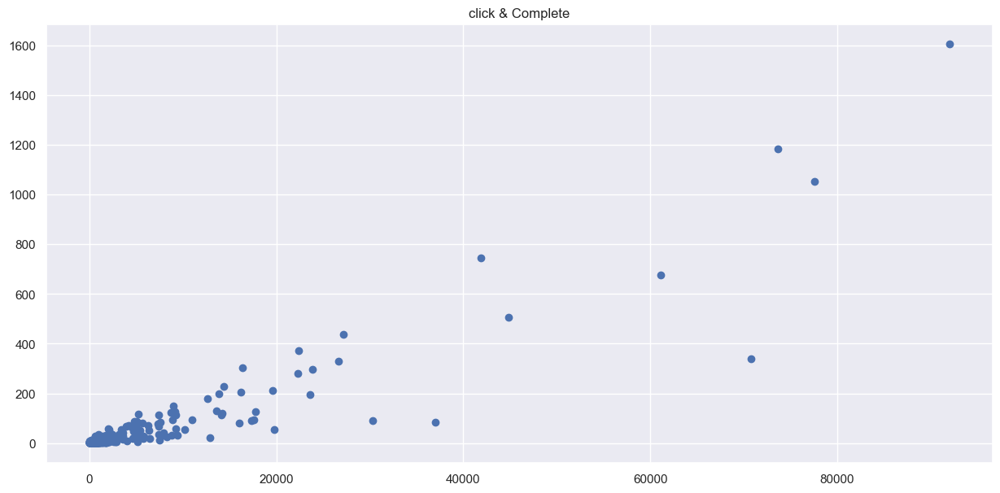

In [26]:
#Scatter Plot for Clicks
f,(ax2) = plt.subplots(1,1, sharey=True, figsize=(15,7))
ax2.scatter(data_outlierNA['impression'], data_outlierNA['click'])
ax2.set_title('click & Complete')

## Multicollinearity

In [63]:
data_with_dummies =  pd.get_dummies(data_outlierNA, drop_first=True)
data_with_dummies

,impression,complete,click,CTR,LTR,district_AGRA,district_AHMED NAGAR,district_AHMEDABAD,district_AJMER,district_ALAPPUZHA,...,district_WEST GODAVARI,district_WEST MIDNAPORE,district_Warangal,district_West Garo Hills,district_West Godavari,district_West Tripura,district_YAMUNANAGAR,district_Yavatmal,device_os_IOS,device_os_WINDOWS
1,129,127,1,0.007752,0.984496,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,4727,4344,49,0.010366,0.918976,True,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,619,563,3,0.004847,0.909532,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,92016,75850,1606,0.017453,0.824313,False,False,True,False,False,...,False,False,False,False,False,False,False,False,False,False
5,3403,2639,31,0.009110,0.775492,False,False,True,False,False,...,False,False,False,False,False,False,False,False,True,False
6,1705,1338,33,0.019355,0.784751,False,False,False,True,False,...,False,False,False,False,False,False,False,False,False,False
7,247,241,1,0.004049,0.975709,False,False,False,False,True,...,False,False,False,False,False,False,False,False,False,False
8,152,124,5,0.032895,0.815789,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
9,3148,2896,30,0.009530,0.919949,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
10,111,88,1,0.009009,0.792793,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [64]:
dummy_columns = ['district_AGRA',
       'district_AHMED NAGAR', 'district_AHMEDABAD', 'district_AJMER',
       'district_ALAPPUZHA', 'district_ALIGARH', 'district_ALLAHABAD',
       'district_ALMORA', 'district_ALWAR', 'district_AMBALA',
       'district_AMBEDKAR NAGAR', 'district_AMRAVATI', 'district_AMRELI',
       'district_AMRITSAR', 'district_ANAND', 'district_ANANTHAPUR',
       'district_ANANTHNAG', 'district_ANGUL', 'district_AURAIYA',
       'district_AURANGABAD', 'district_AZAMGARH', 'district_Aizawl',
       'district_Ananthapur', 'district_BAGALKOT', 'district_BAGPAT',
       'district_BALAGHAT', 'district_BALESWAR', 'district_BALLIA',
       'district_BALOD BAZER', 'district_BANASKANTHA', 'district_BANKA',
       'district_BANSWARA', 'district_BARDHAMAN', 'district_BAREILLY',
       'district_BARGARH', 'district_BATHINDA', 'district_BEED',
       'district_BELAGAVI', 'district_BELLARY', 'district_BENGALURU',
       'district_BENGALURU RURAL', 'district_BETUL', 'district_BHADRAK',
       'district_BHAGALPUR', 'district_BHANDARA', 'district_BHARATPUR',
       'district_BHARUCH', 'district_BHAVNAGAR', 'district_BHIND',
       'district_BHIWANI', 'district_BHOPAL', 'district_BIJAPUR',
       'district_BIJAPUR(KAR)', 'district_BIJNOR', 'district_BIKANER',
       'district_BILASPUR HP', 'district_BILASPURCGH', 'district_BIRBHUM',
       'district_BOKARO', 'district_BONGAIGAON', 'district_BUDAUN',
       'district_BUDGAM', 'district_BULANDSHAHR', 'district_BURHANPUR',
       'district_Bangalore', 'district_Baramulla', 'district_Bengaluru',
       'district_Bishnupur', 'district_CACHAR', 'district_CENTRAL DELHI',
       'district_CHAMBA', 'district_CHANDAULI', 'district_CHANDIGHAR',
       'district_CHANDRAPUR', 'district_CHENNAI', 'district_CHITRADURGA',
       'district_CHITTOOR', 'district_CHITTORGARH', 'district_COIMBATORE',
       'district_COOCH BEHAR', 'district_CUDDALORE', 'district_CUTTACK',
       'district_Chittoor', 'district_Churachandpur',
       'district_DADRA  NAGAR HAVELI', 'district_DAKSHINA KANNADA',
       'district_DARBHANGA', 'district_DARJILING', 'district_DAUSA',
       'district_DEHRADUN', 'district_DEVBHOOMI DWERKA', 'district_DEWAS',
       'district_DHANBAD', 'district_DHULE', 'district_DIBRUGARH',
       'district_DINDIGUL', 'district_DODA', 'district_DUMKA',
       'district_DURG', 'district_Dakshina Kannada', 'district_Dharwad',
       'district_Dimapur', 'district_EAST DELHI',
       'district_EAST GODAVARI', 'district_EAST SIKKIM',
       'district_EAST SINGHBHUM', 'district_ERNAKULAM', 'district_ERODE',
       'district_East Garo Hills', 'district_East Khasi Hills',
       'district_FAIZABAD', 'district_FARIDABAD', 'district_FARIDKOT',
       'district_FATEHABAD', 'district_FATEHGARH SAHIB',
       'district_FAZILKA', 'district_FIROZPUR', 'district_GADWAL',
       'district_GANDERBAL', 'district_GANDHI NAGAR', 'district_GANJAM',
       'district_GAUTAM BUDDHA NAGAR', 'district_GAYA',
       'district_GHAZIABAD', 'district_GHAZIPUR', 'district_GIR SOMNATH',
       'district_GODDA', 'district_GOLAGHAT', 'district_GONDA',
       'district_GOPALGANJ', 'district_GORAKHPUR', 'district_GUNA',
       'district_GUNTUR', 'district_GURDASPUR', 'district_GURGAON',
       'district_GWALIOR', 'district_Guntur', 'district_HAMIRPUR',
       'district_HAMIRPURHP', 'district_HAPUR', 'district_HARIDWAR',
       'district_HATHRAS', 'district_HAVERI', 'district_HAZARIBAG',
       'district_HISAR', 'district_HOOGHLY', 'district_HOSHIARPUR',
       'district_HOWRAH', 'district_HYDERABAD', 'district_IDUKKI',
       'district_INDORE', 'district_Imphal West', 'district_JABALPUR',
       'district_JAGATSINGHAPUR', 'district_JAGTIAL', 'district_JAIPUR',
       'district_JAJAPUR', 'district_JALANDHAR', 'district_JALGAON',
       'district_JALPAIGURI', 'district_JAMMU', 'district_JAMNAGAR',
       'district_JANJGIRCHAMPA', 'district_JAUNPUR',
       'district_JAYASHANKAR', 'district_JHAJJAR', 'district_JHALAWAR',
       'district_JHANSI', 'district_JHARSUGUDA', 'district_JHUJHUNU',
       'district_JIND', 'district_JODHPUR', 'district_JORHAT',
       'district_JUNAGADH', 'district_Jalgaon', 'district_KACHCHH',
       'district_KADAPA', 'district_KAITHAL', 'district_KALABURAGI',
       'district_KAMRUP', 'district_KAMRUP METROPOLITAN',
       'district_KANCHIPURAM', 'district_KANGRA', 'district_KANNUR',
       'district_KANPUR NAGAR', 'district_KANYAKUMARI',
       'district_KAPURTHALA', 'district_KARGIL', 'district_KARNAL',
       'district_KASARGOD', 'district_KATHUA', 'district_KATIHAR',
       'district_KATNI', 'district_KAUSHAMBI', 'district_KHAMMAM',
       'district_KHEDA', 'district_KHORDA', 'district_KINNAUR',
       'district_KOLAR', 'district_KOLKATA', 'district_KOLLAM',
       'district_KOPPAL', 'district_KORAPUT', 'district_KORBA',
       'district_KOTA', 'district_KOTTAYAM', 'district_KOZHIKODE',
       'district_KRISHNA', 'district_KRISHNAGIRI', 'district_KULGAM',
       'district_KULLU', 'district_KURNOOL', 'district_KURUKSHETRA',
       'district_Kanchipuram', 'district_Kohima', 'district_Kolasib',
       'district_Kolhapur', 'district_Kupwara', 'district_Kurnool',
       'district_LAKHIMPUR', 'district_LATUR', 'district_LUCKNOW',
       'district_LUDHIANA', 'district_Lucknow', 'district_Lunglei',
       'district_MADURAI', 'district_MAHABUB NAGAR',
       'district_MAHASAMUND', 'district_MAHENDRAGARH',
       'district_MAHESANA', 'district_MALAPPURAM', 'district_MALDA',
       'district_MANCHERIAL', 'district_MANDI', 'district_MANSA',
       'district_MATHURA', 'district_MAU', 'district_MAYURBHANJ',
       'district_MEDAK', 'district_MEERUT', 'district_MEWAT',
       'district_MOGA', 'district_MOHALI', 'district_MORADABAD',
       'district_MORBI', 'district_MORENA', 'district_MUKTSAR',
       'district_MUMBAI', 'district_MUMBAI SUBUEBAN', 'district_MUNGER',
       'district_MURSHIDABAD', 'district_MUZAFFARNAGAR',
       'district_MUZAFFARPUR', 'district_Malegaon', 'district_Mammit',
       'district_Mokokchung', 'district_Mysuru', 'district_NADIA',
       'district_NAGAON', 'district_NAGAPATTINAM', 'district_NAGPUR',
       'district_NAINITAL', 'district_NALANDA', 'district_NALBARI',
       'district_NALGONDA', 'district_NAMAKKAL', 'district_NANDED',
       'district_NASHIK', 'district_NAVSARI', 'district_NAWANSHAHR',
       'district_NELLORE', 'district_NEW DELHI', 'district_NIZAMABAD',
       'district_NORTH 24 PARGANAS', 'district_NORTH DELHI',
       'district_NORTH DINAJPUR', 'district_NORTH EAST DELHI',
       'district_NORTH GOA', 'district_NORTH WEST DELHI',
       'district_Nagpur', 'district_New Delhi', 'district_OSMANABAD',
       'district_PALAKKAD', 'district_PALGHAR', 'district_PALWAL',
       'district_PANCH MAHALS', 'district_PANCHKULA', 'district_PANIPAT',
       'district_PANNA', 'district_PATAN', 'district_PATHANKOT',
       'district_PATIALA', 'district_PATNA', 'district_PAURI GARHWAL',
       'district_PEDDAPALLI', 'district_PITHORAGARH', 'district_POONCH',
       'district_PORBANDAR', 'district_PRAKASAM', 'district_PRATAPGARH',
       'district_PUNE', 'district_PURI', 'district_Papum Pare',
       'district_Parkal', 'district_Patna', 'district_Pune',
       'district_RAEBARELI', 'district_RAIGARH', 'district_RAIGARH(MH)',
       'district_RAIPUR', 'district_RAISEN', 'district_RAJAURI',
       'district_RAJKOT', 'district_RAJNANDGAON', 'district_RAMBAN',
       'district_RAMGARH', 'district_RANCHI', 'district_RANGAREDDY',
       'district_RATNAGIRI', 'district_RAYAGADA', 'district_REWA',
       'district_REWARI', 'district_ROHTAK', 'district_ROHTAS',
       'district_ROPAR', 'district_Ranga Reddy', 'district_SAGAR',
       'district_SAHARANPUR', 'district_SAHARSA', 'district_SALEM',
       'district_SAMASTIPUR', 'district_SAMBA', 'district_SAMBALPUR',
       'district_SANGAREDDY', 'district_SANGRUR',
       'district_SANT RAVIDAS NAGAR', 'district_SARAN', 'district_SATARA',
       'district_SATNA', 'district_SEONI', 'district_SERAIKELAKHARSAWAN',
       'district_SHAHDARA', 'district_SHAJAPUR', 'district_SHIMLA',
       'district_SHIVAMOGGA', 'district_SHIVPURI', 'district_SHOPIAN',
       'district_SIDDIPET', 'district_SIKAR', 'district_SIMDEGA',
       'district_SIRMAUR', 'district_SIROHI', 'district_SIRSA',
       'district_SOLAN', 'district_SOLAPUR', 'district_SONAPUR',
       'district_SONIPAT', 'district_SONITPUR',
       'district_SOUTH 24 PARGANAS', 'district_SOUTH DELHI',
       'district_SOUTH DINAJPUR', 'district_SOUTH GOA',
       'district_SOUTH WEST DELHI', 'district_SRI GANGANAGAR',
       'district_SRIKAKULAM', 'district_SRINAGAR', 'district_SUNDERGARH',
       'district_SURAT', 'district_SURENDRA NAGAR', 'district_SURYAPET',
       'district_Sangli', 'district_Senapati', 'district_TARN TARAN',
       'district_THANE', 'district_THANJAVUR',
       'district_THIRUVANANTHAPURAM', 'district_THRISSUR',
       'district_TIKAMGARH', 'district_TIRUCHIRAPPALLI',
       'district_TIRUNELVELI', 'district_TIRUPPUR', 'district_TIRUVALLUR',
       'district_TIRUVANNAMALAI', 'district_TIRUVARUR',
       'district_TUMAKURU', 'district_Trimulgherry', 'district_UDAIPUR',
       'district_UDALGURI', 'district_UDHAMPUR', 'district_UDUPI',
       'district_UJJAIN', 'district_UNA', 'district_VADODARA',
       'district_VALSAD', 'district_VARANASI', 'district_VELLORE',
       'district_VILLUPURAM', 'district_VISAKHAPATNAM',
       'district_VIZIANAGARAM', 'district_WARDHA', 'district_WASHIM',
       'district_WEST CHAMPARAN', 'district_WEST DELHI',
       'district_WEST GODAVARI', 'district_WEST MIDNAPORE',
       'district_Warangal', 'district_West Garo Hills',
       'district_West Godavari', 'district_West Tripura',
       'district_YAMUNANAGAR', 'district_Yavatmal', 'device_os_IOS',
       'device_os_WINDOWS']

data_with_dummies[dummy_columns] = data_with_dummies[dummy_columns].astype(int)
print(data_with_dummies)

     impression  complete  click       CTR       LTR  district_AGRA  \
1           129       127      1  0.007752  0.984496              0   
2          4727      4344     49  0.010366  0.918976              1   
3           619       563      3  0.004847  0.909532              0   
4         92016     75850   1606  0.017453  0.824313              0   
5          3403      2639     31  0.009110  0.775492              0   
6          1705      1338     33  0.019355  0.784751              0   
7           247       241      1  0.004049  0.975709              0   
8           152       124      5  0.032895  0.815789              0   
9          3148      2896     30  0.009530  0.919949              0   
10          111        88      1  0.009009  0.792793              0   
11          534       458      4  0.007491  0.857678              0   
12          747       658      2  0.002677  0.880857              0   
13          947       802     36  0.038015  0.846885              0   
14    

In [66]:
#for checking the VIF to identify those features which are correlated, features having VIF>2 (approximately) must be removed

from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
X = add_constant(data_with_dummies[['district_AGRA',
       'district_AHMED NAGAR', 'district_AJMER',
       'district_ALAPPUZHA', 'district_ALIGARH', 'district_ALLAHABAD',
       'district_ALMORA', 'district_AMBEDKAR NAGAR', 'district_AMRAVATI', 'district_AMRELI',
       'district_AMRITSAR', 'district_ANAND', 'district_ANANTHAPUR',
       'district_ANANTHNAG', 'district_ANGUL', 'district_AURAIYA',
       'district_AURANGABAD', 'district_AZAMGARH', 'district_Aizawl',
       'district_Ananthapur', 'district_BAGALKOT', 'district_BAGPAT',
       'district_BALAGHAT', 'district_BALESWAR', 'district_BALLIA',
       'district_BALOD BAZER', 'district_BANASKANTHA', 'district_BANKA',
       'district_BANSWARA', 'district_BARDHAMAN', 'district_BAREILLY',
       'district_BARGARH', 'district_BATHINDA', 'district_BEED',
       'district_BELAGAVI', 'district_BELLARY', 'district_BENGALURU',
       'district_BENGALURU RURAL', 'district_BETUL', 'district_BHADRAK',
       'district_BHAGALPUR', 'district_BHANDARA', 'district_BHARATPUR',
       'district_BHARUCH', 'district_BHAVNAGAR', 'district_BHIND',
       'district_BHIWANI', 'district_BHOPAL', 'district_BIJAPUR',
       'district_BIJAPUR(KAR)', 'district_BIJNOR', 'district_BIKANER',
       'district_BILASPUR HP', 'district_BILASPURCGH', 'district_BIRBHUM',
       'district_BOKARO', 'district_BONGAIGAON', 'district_BUDAUN',
       'district_BUDGAM', 'district_BULANDSHAHR', 'district_BURHANPUR',
       'district_Bangalore', 'district_Baramulla', 'district_Bengaluru',
       'district_Bishnupur', 'district_CACHAR', 'district_CENTRAL DELHI',
       'district_CHAMBA', 'district_CHANDAULI', 'district_CHANDIGHAR',
       'district_CHANDRAPUR', 'district_CHENNAI', 'district_CHITRADURGA',
       'district_CHITTOOR', 'district_CHITTORGARH', 'district_COIMBATORE',
       'district_COOCH BEHAR', 'district_CUDDALORE', 'district_CUTTACK',
       'district_Chittoor', 'district_Churachandpur',
       'district_DADRA  NAGAR HAVELI', 'district_DAKSHINA KANNADA',
       'district_DARBHANGA', 'district_DARJILING', 'district_DAUSA',
       'district_DEHRADUN', 'district_DEVBHOOMI DWERKA', 'district_DEWAS',
       'district_DHANBAD', 'district_DHULE', 'district_DIBRUGARH',
       'district_DINDIGUL', 'district_DODA', 'district_DUMKA',
       'district_DURG', 'district_Dakshina Kannada', 'district_Dharwad',
       'district_Dimapur', 'district_EAST DELHI',
       'district_EAST GODAVARI', 'district_EAST SIKKIM',
       'district_EAST SINGHBHUM', 'district_ERNAKULAM', 'district_ERODE',
       'district_East Garo Hills', 'district_East Khasi Hills',
       'district_FAIZABAD', 'district_FARIDABAD', 'district_FARIDKOT',
       'district_FATEHABAD', 'district_FATEHGARH SAHIB',
       'district_FAZILKA', 'district_FIROZPUR', 'district_GADWAL',
       'district_GANDERBAL', 'district_GANDHI NAGAR', 'district_GANJAM',
       'district_GAUTAM BUDDHA NAGAR', 'district_GAYA',
       'district_GHAZIABAD', 'district_GHAZIPUR', 'district_GIR SOMNATH',
       'district_GODDA', 'district_GOLAGHAT', 'district_GONDA',
       'district_GOPALGANJ', 'district_GORAKHPUR', 'district_GUNA',
       'district_GUNTUR', 'district_GURDASPUR', 'district_GURGAON',
       'district_GWALIOR', 'district_Guntur', 'district_HAMIRPUR',
       'district_HAMIRPURHP', 'district_HAPUR', 'district_HARIDWAR',
       'district_HATHRAS', 'district_HAVERI', 'district_HAZARIBAG',
       'district_HISAR', 'district_HOOGHLY', 'district_HOSHIARPUR',
       'district_HOWRAH', 'district_HYDERABAD', 'district_IDUKKI',
       'district_INDORE', 'district_Imphal West', 'district_JABALPUR',
       'district_JAGATSINGHAPUR', 'district_JAGTIAL', 'district_JAIPUR',
       'district_JAJAPUR', 'district_JALANDHAR', 'district_JALGAON',
       'district_JALPAIGURI', 'district_JAMMU', 'district_JAMNAGAR',
       'district_JANJGIRCHAMPA', 'district_JAUNPUR',
       'district_JAYASHANKAR', 'district_JHAJJAR', 'district_JHALAWAR',
       'district_JHANSI', 'district_JHARSUGUDA', 'district_JHUJHUNU',
       'district_JIND', 'district_JODHPUR', 'district_JORHAT',
       'district_JUNAGADH', 'district_Jalgaon', 'district_KACHCHH',
       'district_KADAPA', 'district_KAITHAL', 'district_KALABURAGI',
       'district_KAMRUP', 'district_KAMRUP METROPOLITAN',
       'district_KANCHIPURAM', 'district_KANGRA', 'district_KANNUR',
       'district_KANPUR NAGAR', 'district_KANYAKUMARI',
       'district_KAPURTHALA', 'district_KARGIL', 'district_KARNAL',
       'district_KASARGOD', 'district_KATHUA', 'district_KATIHAR',
       'district_KATNI', 'district_KAUSHAMBI', 'district_KHAMMAM',
       'district_KHEDA', 'district_KHORDA', 'district_KINNAUR',
       'district_KOLAR', 'district_KOLKATA', 'district_KOLLAM',
       'district_KOPPAL', 'district_KORAPUT', 'district_KORBA',
       'district_KOTA', 'district_KOTTAYAM', 'district_KOZHIKODE',
       'district_KRISHNA', 'district_KRISHNAGIRI', 'district_KULGAM',
       'district_KULLU', 'district_KURNOOL', 'district_KURUKSHETRA',
       'district_Kanchipuram', 'district_Kohima', 'district_Kolasib',
       'district_Kolhapur', 'district_Kupwara', 'district_Kurnool',
       'district_LAKHIMPUR', 'district_LATUR', 'district_LUCKNOW',
       'district_LUDHIANA', 'district_Lucknow', 'district_Lunglei',
       'district_MADURAI', 'district_MAHABUB NAGAR',
       'district_MAHASAMUND', 'district_MAHENDRAGARH',
       'district_MAHESANA', 'district_MALAPPURAM', 'district_MALDA',
       'district_MANCHERIAL', 'district_MANDI', 'district_MANSA',
       'district_MATHURA', 'district_MAU', 'district_MAYURBHANJ',
       'district_MEDAK', 'district_MEERUT', 'district_MEWAT',
       'district_MOGA', 'district_MOHALI', 'district_MORADABAD',
       'district_MORBI', 'district_MORENA', 'district_MUKTSAR',
       'district_MUMBAI', 'district_MUMBAI SUBUEBAN', 'district_MUNGER',
       'district_MURSHIDABAD', 'district_MUZAFFARNAGAR',
       'district_MUZAFFARPUR', 'district_Malegaon', 'district_Mammit',
       'district_Mokokchung', 'district_Mysuru', 'district_NADIA',
       'district_NAGAON', 'district_NAGAPATTINAM', 'district_NAGPUR',
       'district_NAINITAL', 'district_NALANDA', 'district_NALBARI',
       'district_NALGONDA', 'district_NAMAKKAL', 'district_NANDED',
       'district_NASHIK', 'district_NAVSARI', 'district_NAWANSHAHR',
       'district_NELLORE', 'district_NEW DELHI', 'district_NIZAMABAD',
       'district_NORTH 24 PARGANAS', 'district_NORTH DELHI',
       'district_NORTH DINAJPUR', 'district_NORTH EAST DELHI',
       'district_NORTH GOA', 'district_NORTH WEST DELHI',
       'district_Nagpur', 'district_New Delhi', 'district_OSMANABAD',
       'district_PALAKKAD', 'district_PALGHAR', 'district_PALWAL',
       'district_PANCH MAHALS', 'district_PANCHKULA', 'district_PANIPAT',
       'district_PANNA', 'district_PATAN', 'district_PATHANKOT',
       'district_PATIALA', 'district_PATNA', 'district_PAURI GARHWAL',
       'district_PEDDAPALLI', 'district_PITHORAGARH', 'district_POONCH',
       'district_PORBANDAR', 'district_PRAKASAM', 'district_PRATAPGARH',
       'district_PUNE', 'district_PURI', 'district_Papum Pare',
       'district_Parkal', 'district_Patna', 'district_Pune',
       'district_RAEBARELI', 'district_RAIGARH', 'district_RAIGARH(MH)',
       'district_RAIPUR', 'district_RAISEN', 'district_RAJAURI',
       'district_RAJKOT', 'district_RAJNANDGAON', 'district_RAMBAN',
       'district_RAMGARH', 'district_RANCHI', 'district_RANGAREDDY',
       'district_RATNAGIRI', 'district_RAYAGADA', 'district_REWA',
       'district_REWARI', 'district_ROHTAK', 'district_ROHTAS',
       'district_ROPAR', 'district_Ranga Reddy', 'district_SAGAR',
       'district_SAHARANPUR', 'district_SAHARSA', 'district_SALEM',
       'district_SAMASTIPUR', 'district_SAMBA', 'district_SAMBALPUR',
       'district_SANGAREDDY',
       'district_SANT RAVIDAS NAGAR', 'district_SARAN', 'district_SATARA',
       'district_SATNA', 'district_SEONI', 'district_SERAIKELAKHARSAWAN',
        'district_SHAJAPUR', 'district_SHIMLA',
       'district_SHIVAMOGGA', 'district_SHIVPURI', 'district_SHOPIAN',
       'district_SIDDIPET', 'district_SIKAR', 'district_SIMDEGA',
       'district_SIRMAUR', 'district_SIROHI',
       'district_SOLAN', 'district_SOLAPUR', 'district_SONAPUR',
        'district_SONITPUR',
       'district_SOUTH 24 PARGANAS', 'district_SOUTH DELHI',
       'district_SOUTH DINAJPUR', 'district_SOUTH GOA', 'district_SRI GANGANAGAR',
       'district_SRIKAKULAM', 'district_SUNDERGARH',
       'district_SURENDRA NAGAR', 'district_SURYAPET',
       'district_Sangli', 'district_Senapati', 'district_TARN TARAN', 'district_THANJAVUR',
       'district_THIRUVANANTHAPURAM', 'district_THRISSUR',
       'district_TIKAMGARH', 'district_TIRUCHIRAPPALLI',
       'district_TIRUNELVELI', 'district_TIRUPPUR',
       'district_TIRUVANNAMALAI', 'district_TIRUVARUR',
       'district_TUMAKURU', 'district_Trimulgherry', 'district_UDAIPUR',
       'district_UDALGURI', 'district_UDHAMPUR', 'district_UDUPI',
       'district_UJJAIN', 'district_UNA', 'district_VARANASI', 'district_VELLORE',
       'district_VILLUPURAM', 'district_VISAKHAPATNAM',
       'district_VIZIANAGARAM', 'district_WARDHA', 'district_WASHIM',
       'district_WEST CHAMPARAN',
       'district_WEST GODAVARI', 'district_WEST MIDNAPORE',
       'district_Warangal', 'district_West Garo Hills',
       'district_West Godavari',
       'district_YAMUNANAGAR', 'district_Yavatmal', 'device_os_IOS',
       'device_os_WINDOWS', 'impression']])

# Calculate VIF for each dummy variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Display the VIF data
print(vif_data)

                         Variable         VIF
0                           const  509.000629
1                   district_AGRA    1.997637
2            district_AHMED NAGAR    1.996089
3              district_AHMEDABAD    3.402849
4                  district_AJMER    1.996255
5              district_ALAPPUZHA    1.996072
6                district_ALIGARH    1.996071
7              district_ALLAHABAD    1.996746
8                 district_ALMORA    1.996071
9                  district_ALWAR    3.002802
10                district_AMBALA    3.002624
11        district_AMBEDKAR NAGAR    1.996082
12              district_AMRAVATI    1.996089
13                district_AMRELI    1.996074
14              district_AMRITSAR    3.008896
15                 district_ANAND    1.996104
16            district_ANANTHAPUR    2.023658
17             district_ANANTHNAG    1.996093
18                 district_ANGUL    1.996071
19               district_AURAIYA    1.996071
20            district_AURANGABAD 

In [72]:
# Removing those features which are having VIF>2 (approximately) must be removed to calculate a better or stable estimate of 
# coefficients

from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

X = add_constant(data_with_dummies.drop(['click','complete','CTR', 'LTR','district_AHMEDABAD', 'district_ALWAR', 'district_AMBALA', 'district_AMRITSAR', 'district_Aizawl', 'district_BARDHAMAN', 'district_BATHINDA',
'district_BENGALURU RURAL', 'district_BHARATPUR', 'district_BHARUCH', 'district_BHAVNAGAR', 'district_BHIWANI', 'district_BHOPAL', 'district_BULANDSHAHR',
'district_CHANDIGHAR', 'district_CHENNAI', 'district_DEHRADUN',  'district_EAST DELHI', 'district_FARIDABAD', 'district_FARIDKOT', 
'district_FATEHABAD', 'district_FATEHGARH SAHIB', 'district_GAUTAM BUDDHA NAGAR', 'district_GHAZIABAD', 'district_GURDASPUR', 'district_GURGAON',
'district_HAPUR', 'district_HISAR', 'district_HOSHIARPUR', 'district_INDORE', 'district_Imphal West', 'district_JAIPUR', 'district_JALANDHAR',
'district_JALPAIGURI', 'district_JAMMU', 'district_JAMNAGAR', 'district_JHAJJAR', 'district_JIND', 'district_JODHPUR', 'district_KAMRUP',
'district_KAMRUP METROPOLITAN', 'district_KANCHIPURAM', 'district_KANGRA', 'district_KARNAL', 'district_KHORDA', 'district_KOLKATA', 'district_KOZHIKODE', 
'district_KRISHNA', 'district_KURUKSHETRA', 'district_LUDHIANA', 'district_MANDI', 'district_MEERUT', 'district_MEWAT','district_MOHALI', 
'district_MUMBAI SUBUEBAN', 'district_MUZAFFARNAGAR', 'district_NASHIK', 'district_NEW DELHI', 'district_NORTH 24 PARGANAS', 'district_NORTH DELHI', 
'district_NORTH EAST DELHI', 'district_NORTH GOA', 'district_NORTH WEST DELHI', 'district_Nagpur', 'district_New Delhi', 'district_PALGHAR',
'district_PALWAL', 'district_PANIPAT', 'district_PATIALA', 'district_PUNE', 'district_Patna', 'district_Pune', 'district_RAIGARH(MH)', 
'district_RAIPUR', 'district_RAJKOT', 'district_RANGAREDDY', 'district_REWARI', 'district_ROHTAK', 'district_ROPAR', 'district_SANGRUR', 
'district_SHAHDARA', 'district_SIRSA', 'district_SONIPAT', 'district_SOUTH DELHI', 'district_SOUTH DINAJPUR', 'district_SOUTH WEST DELHI',
'district_SRINAGAR', 'district_SURAT', 'district_THANE', 'district_TIRUVALLUR', 'district_VADODARA', 'district_VALSAD', 'district_WEST DELHI', 
'district_West Tripura', 'device_os_IOS', 'device_os_WINDOWS'], axis=1))
# Calculate VIF for each dummy variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Display the VIF data
print(vif_data)

                         Variable       VIF
0                           const  3.219672
1                      impression  1.183951
2                   district_AGRA  1.003293
3            district_AHMED NAGAR  1.004135
4                  district_AJMER  1.003816
5              district_ALAPPUZHA  1.004261
6                district_ALIGARH  1.004294
7              district_ALLAHABAD  1.003499
8                 district_ALMORA  1.004309
9         district_AMBEDKAR NAGAR  1.004169
10              district_AMRAVATI  1.004132
11                district_AMRELI  1.004229
12                 district_ANAND  1.004077
13            district_ANANTHAPUR  1.004342
14             district_ANANTHNAG  1.004115
15                 district_ANGUL  1.004320
16               district_AURAIYA  1.004327
17            district_AURANGABAD  1.003949
18              district_AZAMGARH  1.003888
19            district_Ananthapur  1.004157
20              district_BAGALKOT  1.004233
21                district_BAGPA

In [76]:
data_with_dummies

,impression,complete,click,CTR,LTR,district_AGRA,district_AHMED NAGAR,district_AHMEDABAD,district_AJMER,district_ALAPPUZHA,...,district_WEST GODAVARI,district_WEST MIDNAPORE,district_Warangal,district_West Garo Hills,district_West Godavari,district_West Tripura,district_YAMUNANAGAR,district_Yavatmal,device_os_IOS,device_os_WINDOWS
1,129,127,1,0.007752,0.984496,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,4727,4344,49,0.010366,0.918976,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,619,563,3,0.004847,0.909532,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,92016,75850,1606,0.017453,0.824313,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
5,3403,2639,31,0.009110,0.775492,0,0,1,0,0,...,0,0,0,0,0,0,0,0,1,0
6,1705,1338,33,0.019355,0.784751,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
7,247,241,1,0.004049,0.975709,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
8,152,124,5,0.032895,0.815789,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,3148,2896,30,0.009530,0.919949,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,111,88,1,0.009009,0.792793,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [77]:
# Creating a data frame with negligible Multicollinearity

data_with_dummies_NO_mlc = data_with_dummies.drop(['CTR', 'LTR','district_AHMEDABAD', 'district_ALWAR', 'district_AMBALA', 'district_AMRITSAR', 'district_Aizawl', 'district_BARDHAMAN', 'district_BATHINDA',
'district_BENGALURU RURAL', 'district_BHARATPUR', 'district_BHARUCH', 'district_BHAVNAGAR', 'district_BHIWANI', 'district_BHOPAL', 'district_BULANDSHAHR',
'district_CHANDIGHAR', 'district_CHENNAI', 'district_DEHRADUN',  'district_EAST DELHI', 'district_FARIDABAD', 'district_FARIDKOT', 
'district_FATEHABAD', 'district_FATEHGARH SAHIB', 'district_GAUTAM BUDDHA NAGAR', 'district_GHAZIABAD', 'district_GURDASPUR', 'district_GURGAON',
'district_HAPUR', 'district_HISAR', 'district_HOSHIARPUR', 'district_INDORE', 'district_Imphal West', 'district_JAIPUR', 'district_JALANDHAR',
'district_JALPAIGURI', 'district_JAMMU', 'district_JAMNAGAR', 'district_JHAJJAR', 'district_JIND', 'district_JODHPUR', 'district_KAMRUP',
'district_KAMRUP METROPOLITAN', 'district_KANCHIPURAM', 'district_KANGRA', 'district_KARNAL', 'district_KHORDA', 'district_KOLKATA', 'district_KOZHIKODE', 
'district_KRISHNA', 'district_KURUKSHETRA', 'district_LUDHIANA', 'district_MANDI', 'district_MEERUT', 'district_MEWAT','district_MOHALI', 
'district_MUMBAI SUBUEBAN', 'district_MUZAFFARNAGAR', 'district_NASHIK', 'district_NEW DELHI', 'district_NORTH 24 PARGANAS', 'district_NORTH DELHI', 
'district_NORTH EAST DELHI', 'district_NORTH GOA', 'district_NORTH WEST DELHI', 'district_Nagpur', 'district_New Delhi', 'district_PALGHAR',
'district_PALWAL', 'district_PANIPAT', 'district_PATIALA', 'district_PUNE', 'district_Patna', 'district_Pune', 'district_RAIGARH(MH)', 
'district_RAIPUR', 'district_RAJKOT', 'district_RANGAREDDY', 'district_REWARI', 'district_ROHTAK', 'district_ROPAR', 'district_SANGRUR', 
'district_SHAHDARA', 'district_SIRSA', 'district_SONIPAT', 'district_SOUTH DELHI', 'district_SOUTH DINAJPUR', 'district_SOUTH WEST DELHI',
'district_SRINAGAR', 'district_SURAT', 'district_THANE', 'district_TIRUVALLUR', 'district_VADODARA', 'district_VALSAD', 'district_WEST DELHI', 
'district_West Tripura', 'device_os_IOS', 'device_os_WINDOWS'], axis=1)

In [80]:
data_with_dummies_NO_mlc.describe()

,impression,complete,click,district_AGRA,district_AHMED NAGAR,district_AJMER,district_ALAPPUZHA,district_ALIGARH,district_ALLAHABAD,district_ALMORA,...,district_WARDHA,district_WASHIM,district_WEST CHAMPARAN,district_WEST GODAVARI,district_WEST MIDNAPORE,district_Warangal,district_West Garo Hills,district_West Godavari,district_YAMUNANAGAR,district_Yavatmal
count,509.000000,509.000000,509.000000,509.000000,509.000000,509.000000,509.000000,509.000000,509.000000,509.000000,...,509.000000,509.000000,509.000000,509.000000,509.000000,509.000000,509.000000,509.000000,509.000000,509.000000
mean,3000.072692,2657.954813,30.905697,0.001965,0.001965,0.001965,0.001965,0.001965,0.001965,0.001965,...,0.001965,0.001965,0.001965,0.001965,0.001965,0.001965,0.001965,0.001965,0.001965,0.001965
std,8887.491036,7742.411334,119.875522,0.044324,0.044324,0.044324,0.044324,0.044324,0.044324,0.044324,...,0.044324,0.044324,0.044324,0.044324,0.044324,0.044324,0.044324,0.044324,0.044324,0.044324
min,4.000000,2.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,207.000000,182.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,541.000000,494.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1791.000000,1601.000000,12.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,92016.000000,75850.000000,1606.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [81]:
data_with_dummies_NO_mlc.columns.values

array(['impression', 'complete', 'click', 'district_AGRA',
       'district_AHMED NAGAR', 'district_AJMER', 'district_ALAPPUZHA',
       'district_ALIGARH', 'district_ALLAHABAD', 'district_ALMORA',
       'district_AMBEDKAR NAGAR', 'district_AMRAVATI', 'district_AMRELI',
       'district_ANAND', 'district_ANANTHAPUR', 'district_ANANTHNAG',
       'district_ANGUL', 'district_AURAIYA', 'district_AURANGABAD',
       'district_AZAMGARH', 'district_Ananthapur', 'district_BAGALKOT',
       'district_BAGPAT', 'district_BALAGHAT', 'district_BALESWAR',
       'district_BALLIA', 'district_BALOD BAZER', 'district_BANASKANTHA',
       'district_BANKA', 'district_BANSWARA', 'district_BAREILLY',
       'district_BARGARH', 'district_BEED', 'district_BELAGAVI',
       'district_BELLARY', 'district_BENGALURU', 'district_BETUL',
       'district_BHADRAK', 'district_BHAGALPUR', 'district_BHANDARA',
       'district_BHIND', 'district_BIJAPUR', 'district_BIJAPUR(KAR)',
       'district_BIJNOR', 'district_B

## Rearranging the data

In [82]:
cols = ['complete', 'click', 'impression', 'district_AGRA',
       'district_AHMED NAGAR', 'district_AJMER', 'district_ALAPPUZHA',
       'district_ALIGARH', 'district_ALLAHABAD', 'district_ALMORA',
       'district_AMBEDKAR NAGAR', 'district_AMRAVATI', 'district_AMRELI',
       'district_ANAND', 'district_ANANTHAPUR', 'district_ANANTHNAG',
       'district_ANGUL', 'district_AURAIYA', 'district_AURANGABAD',
       'district_AZAMGARH', 'district_Ananthapur', 'district_BAGALKOT',
       'district_BAGPAT', 'district_BALAGHAT', 'district_BALESWAR',
       'district_BALLIA', 'district_BALOD BAZER', 'district_BANASKANTHA',
       'district_BANKA', 'district_BANSWARA', 'district_BAREILLY',
       'district_BARGARH', 'district_BEED', 'district_BELAGAVI',
       'district_BELLARY', 'district_BENGALURU', 'district_BETUL',
       'district_BHADRAK', 'district_BHAGALPUR', 'district_BHANDARA',
       'district_BHIND', 'district_BIJAPUR', 'district_BIJAPUR(KAR)',
       'district_BIJNOR', 'district_BIKANER', 'district_BILASPUR HP',
       'district_BILASPURCGH', 'district_BIRBHUM', 'district_BOKARO',
       'district_BONGAIGAON', 'district_BUDAUN', 'district_BUDGAM',
       'district_BURHANPUR', 'district_Bangalore', 'district_Baramulla',
       'district_Bengaluru', 'district_Bishnupur', 'district_CACHAR',
       'district_CENTRAL DELHI', 'district_CHAMBA', 'district_CHANDAULI',
       'district_CHANDRAPUR', 'district_CHITRADURGA', 'district_CHITTOOR',
       'district_CHITTORGARH', 'district_COIMBATORE',
       'district_COOCH BEHAR', 'district_CUDDALORE', 'district_CUTTACK',
       'district_Chittoor', 'district_Churachandpur',
       'district_DADRA  NAGAR HAVELI', 'district_DAKSHINA KANNADA',
       'district_DARBHANGA', 'district_DARJILING', 'district_DAUSA',
       'district_DEVBHOOMI DWERKA', 'district_DEWAS', 'district_DHANBAD',
       'district_DHULE', 'district_DIBRUGARH', 'district_DINDIGUL',
       'district_DODA', 'district_DUMKA', 'district_DURG',
       'district_Dakshina Kannada', 'district_Dharwad',
       'district_Dimapur', 'district_EAST GODAVARI',
       'district_EAST SIKKIM', 'district_EAST SINGHBHUM',
       'district_ERNAKULAM', 'district_ERODE', 'district_East Garo Hills',
       'district_East Khasi Hills', 'district_FAIZABAD',
       'district_FAZILKA', 'district_FIROZPUR', 'district_GADWAL',
       'district_GANDERBAL', 'district_GANDHI NAGAR', 'district_GANJAM',
       'district_GAYA', 'district_GHAZIPUR', 'district_GIR SOMNATH',
       'district_GODDA', 'district_GOLAGHAT', 'district_GONDA',
       'district_GOPALGANJ', 'district_GORAKHPUR', 'district_GUNA',
       'district_GUNTUR', 'district_GWALIOR', 'district_Guntur',
       'district_HAMIRPUR', 'district_HAMIRPURHP', 'district_HARIDWAR',
       'district_HATHRAS', 'district_HAVERI', 'district_HAZARIBAG',
       'district_HOOGHLY', 'district_HOWRAH', 'district_HYDERABAD',
       'district_IDUKKI', 'district_JABALPUR', 'district_JAGATSINGHAPUR',
       'district_JAGTIAL', 'district_JAJAPUR', 'district_JALGAON',
       'district_JANJGIRCHAMPA', 'district_JAUNPUR',
       'district_JAYASHANKAR', 'district_JHALAWAR', 'district_JHANSI',
       'district_JHARSUGUDA', 'district_JHUJHUNU', 'district_JORHAT',
       'district_JUNAGADH', 'district_Jalgaon', 'district_KACHCHH',
       'district_KADAPA', 'district_KAITHAL', 'district_KALABURAGI',
       'district_KANNUR', 'district_KANPUR NAGAR', 'district_KANYAKUMARI',
       'district_KAPURTHALA', 'district_KARGIL', 'district_KASARGOD',
       'district_KATHUA', 'district_KATIHAR', 'district_KATNI',
       'district_KAUSHAMBI', 'district_KHAMMAM', 'district_KHEDA',
       'district_KINNAUR', 'district_KOLAR', 'district_KOLLAM',
       'district_KOPPAL', 'district_KORAPUT', 'district_KORBA',
       'district_KOTA', 'district_KOTTAYAM', 'district_KRISHNAGIRI',
       'district_KULGAM', 'district_KULLU', 'district_KURNOOL',
       'district_Kanchipuram', 'district_Kohima', 'district_Kolasib',
       'district_Kolhapur', 'district_Kupwara', 'district_Kurnool',
       'district_LAKHIMPUR', 'district_LATUR', 'district_LUCKNOW',
       'district_Lucknow', 'district_Lunglei', 'district_MADURAI',
       'district_MAHABUB NAGAR', 'district_MAHASAMUND',
       'district_MAHENDRAGARH', 'district_MAHESANA',
       'district_MALAPPURAM', 'district_MALDA', 'district_MANCHERIAL',
       'district_MANSA', 'district_MATHURA', 'district_MAU',
       'district_MAYURBHANJ', 'district_MEDAK', 'district_MOGA',
       'district_MORADABAD', 'district_MORBI', 'district_MORENA',
       'district_MUKTSAR', 'district_MUMBAI', 'district_MUNGER',
       'district_MURSHIDABAD', 'district_MUZAFFARPUR',
       'district_Malegaon', 'district_Mammit', 'district_Mokokchung',
       'district_Mysuru', 'district_NADIA', 'district_NAGAON',
       'district_NAGAPATTINAM', 'district_NAGPUR', 'district_NAINITAL',
       'district_NALANDA', 'district_NALBARI', 'district_NALGONDA',
       'district_NAMAKKAL', 'district_NANDED', 'district_NAVSARI',
       'district_NAWANSHAHR', 'district_NELLORE', 'district_NIZAMABAD',
       'district_NORTH DINAJPUR', 'district_OSMANABAD',
       'district_PALAKKAD', 'district_PANCH MAHALS', 'district_PANCHKULA',
       'district_PANNA', 'district_PATAN', 'district_PATHANKOT',
       'district_PATNA', 'district_PAURI GARHWAL', 'district_PEDDAPALLI',
       'district_PITHORAGARH', 'district_POONCH', 'district_PORBANDAR',
       'district_PRAKASAM', 'district_PRATAPGARH', 'district_PURI',
       'district_Papum Pare', 'district_Parkal', 'district_RAEBARELI',
       'district_RAIGARH', 'district_RAISEN', 'district_RAJAURI',
       'district_RAJNANDGAON', 'district_RAMBAN', 'district_RAMGARH',
       'district_RANCHI', 'district_RATNAGIRI', 'district_RAYAGADA',
       'district_REWA', 'district_ROHTAS', 'district_Ranga Reddy',
       'district_SAGAR', 'district_SAHARANPUR', 'district_SAHARSA',
       'district_SALEM', 'district_SAMASTIPUR', 'district_SAMBA',
       'district_SAMBALPUR', 'district_SANGAREDDY',
       'district_SANT RAVIDAS NAGAR', 'district_SARAN', 'district_SATARA',
       'district_SATNA', 'district_SEONI', 'district_SERAIKELAKHARSAWAN',
       'district_SHAJAPUR', 'district_SHIMLA', 'district_SHIVAMOGGA',
       'district_SHIVPURI', 'district_SHOPIAN', 'district_SIDDIPET',
       'district_SIKAR', 'district_SIMDEGA', 'district_SIRMAUR',
       'district_SIROHI', 'district_SOLAN', 'district_SOLAPUR',
       'district_SONAPUR', 'district_SONITPUR',
       'district_SOUTH 24 PARGANAS', 'district_SOUTH GOA',
       'district_SRI GANGANAGAR', 'district_SRIKAKULAM',
       'district_SUNDERGARH', 'district_SURENDRA NAGAR',
       'district_SURYAPET', 'district_Sangli', 'district_Senapati',
       'district_TARN TARAN', 'district_THANJAVUR',
       'district_THIRUVANANTHAPURAM', 'district_THRISSUR',
       'district_TIKAMGARH', 'district_TIRUCHIRAPPALLI',
       'district_TIRUNELVELI', 'district_TIRUPPUR',
       'district_TIRUVANNAMALAI', 'district_TIRUVARUR',
       'district_TUMAKURU', 'district_Trimulgherry', 'district_UDAIPUR',
       'district_UDALGURI', 'district_UDHAMPUR', 'district_UDUPI',
       'district_UJJAIN', 'district_UNA', 'district_VARANASI',
       'district_VELLORE', 'district_VILLUPURAM',
       'district_VISAKHAPATNAM', 'district_VIZIANAGARAM',
       'district_WARDHA', 'district_WASHIM', 'district_WEST CHAMPARAN',
       'district_WEST GODAVARI', 'district_WEST MIDNAPORE',
       'district_Warangal', 'district_West Garo Hills',
       'district_West Godavari', 'district_YAMUNANAGAR',
       'district_Yavatmal']

In [83]:
data_preprocessed = data_with_dummies_NO_mlc[cols]
data_preprocessed

,complete,click,impression,district_AGRA,district_AHMED NAGAR,district_AJMER,district_ALAPPUZHA,district_ALIGARH,district_ALLAHABAD,district_ALMORA,...,district_WARDHA,district_WASHIM,district_WEST CHAMPARAN,district_WEST GODAVARI,district_WEST MIDNAPORE,district_Warangal,district_West Garo Hills,district_West Godavari,district_YAMUNANAGAR,district_Yavatmal
1,127,1,129,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,4344,49,4727,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,563,3,619,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,75850,1606,92016,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,2639,31,3403,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,1338,33,1705,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,241,1,247,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,124,5,152,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
9,2896,30,3148,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
10,88,1,111,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0


## Linear Regression For Ad Completion
## Declare inputs and the target

In [164]:
y_complete = data_preprocessed['complete'] #target
x_complete = data_preprocessed.drop(['complete','click'], axis=1) #inputs

In [166]:
x_complete.columns.values

array(['impression', 'district_AGRA', 'district_AHMED NAGAR',
       'district_AJMER', 'district_ALAPPUZHA', 'district_ALIGARH',
       'district_ALLAHABAD', 'district_ALMORA', 'district_AMBEDKAR NAGAR',
       'district_AMRAVATI', 'district_AMRELI', 'district_ANAND',
       'district_ANANTHAPUR', 'district_ANANTHNAG', 'district_ANGUL',
       'district_AURAIYA', 'district_AURANGABAD', 'district_AZAMGARH',
       'district_Ananthapur', 'district_BAGALKOT', 'district_BAGPAT',
       'district_BALAGHAT', 'district_BALESWAR', 'district_BALLIA',
       'district_BALOD BAZER', 'district_BANASKANTHA', 'district_BANKA',
       'district_BANSWARA', 'district_BAREILLY', 'district_BARGARH',
       'district_BEED', 'district_BELAGAVI', 'district_BELLARY',
       'district_BENGALURU', 'district_BETUL', 'district_BHADRAK',
       'district_BHAGALPUR', 'district_BHANDARA', 'district_BHIND',
       'district_BIJAPUR', 'district_BIJAPUR(KAR)', 'district_BIJNOR',
       'district_BIKANER', 'district_BI

In [186]:
y_complete

0        127
1       4344
2        563
3      75850
4       2639
5       1338
6        241
7        124
8       2896
9         88
10       458
11       658
12       802
13        75
14       492
15       589
16       253
17      5108
18      1601
19       725
20        18
21       661
22        57
23        52
24      1040
25      1342
26      3859
27       176
28       540
29       312
30       182
31        32
32      2510
33        37
34       495
35       445
36       312
37         8
38      2087
39        72
40       479
41       108
42      2050
43       813
44       154
45      1861
46       471
47     12278
48      7567
49       673
50        15
51        31
52      1708
53       501
54       217
55       225
56       506
57        50
58       241
59        13
60        61
61      6866
62      1103
63     10581
64       480
65        32
66       349
67       159
68        79
69       298
70      3422
71       305
72       411
73       143
74        43
75       319
76       514

## Create The Regression Ad Completion

In [167]:
reg_complete= LinearRegression()
reg_complete.fit(x_complete,y_complete)

LinearRegression()

In [168]:
y_hat_complete = reg_complete.predict(x_complete)

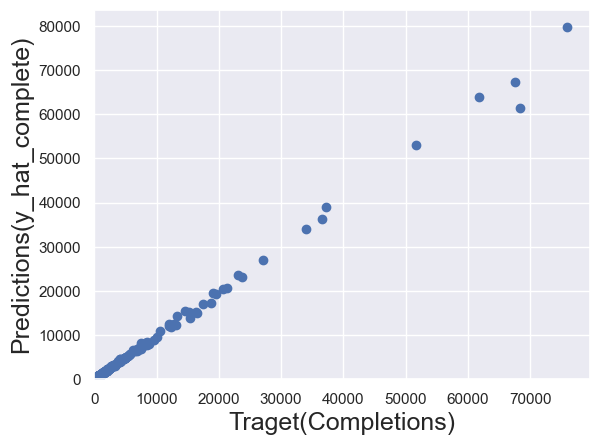

In [170]:
plt.scatter(y_complete, y_hat_complete)
plt.xlabel('Traget(Completions)',size = 18)
plt.ylabel('Predictions(y_hat_complete)',size = 18)
plt.xlim(-10,)
plt.ylim(-10,)
plt.show()

C:\Users\NIGHAT\AppData\Local\Temp\ipykernel_18292\1239610710.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(y_complete - y_hat_complete)


Text(0.5, 1.0, 'Residual PDF')

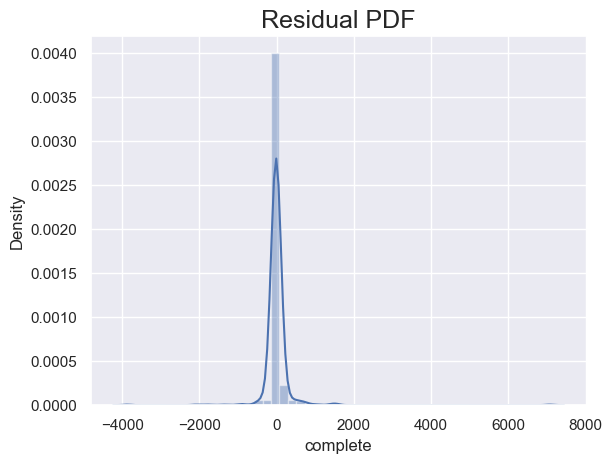

In [171]:
sns.distplot(y_complete - y_hat_complete)
plt.title("Residual PDF", size=18)

In [172]:
reg_complete.score(x_complete,y_complete)

0.9969888505633037

In [173]:
reg_complete.intercept_

88.58634491398197

In [174]:
reg_complete.coef_

array([ 8.65385168e-01,  1.64737967e+02, -6.12597637e+01, -2.26068056e+02,
       -6.13364813e+01, -9.61248904e+01,  8.31811471e+01, -9.66440985e+01,
       -4.48558618e+01, -4.30482302e+01, -1.28951917e+02, -5.67598643e+01,
       -8.70286631e+01, -1.77790293e+01, -9.90863880e+01, -8.76440698e+01,
       -1.07817790e+02,  7.25901356e+00, -2.80097278e+01, -6.04326799e+01,
       -9.00480005e+01, -8.68748258e+01,  6.41044582e+01, -8.62017516e+01,
       -5.74327948e+01, -1.53298209e+02, -6.99519168e+01, -9.01055818e+01,
       -7.68943355e+01, -1.04336424e+02, -8.86249048e+01,  7.02010302e+01,
       -4.07596919e+01,  1.01902191e+03, -9.60863593e+01, -9.22017516e+01,
        6.95088197e+01, -1.67394407e+02, -1.06336395e+02, -8.77402110e+01,
       -7.70865603e+01, -1.15644156e+02, -9.26633210e+01, -6.49134431e+01,
       -3.72615732e+01, -6.57019096e+01, -9.38366106e+01, -7.71248904e+01,
       -9.83748401e+01, -5.17019096e+01, -9.81440554e+01, -4.58366106e+01,
       -6.62211464e+01, -

In [177]:
reg_summary_complete= pd.DataFrame(x_complete.columns.values, columns=["Features"])
reg_summary_complete["Weights"] = reg_complete.coef_
reg_summary_complete

# ADILABAD is the Benchmark for the District 

,Features,Weights
0,impression,0.865385
1,district_AGRA,164.737967
2,district_AHMED NAGAR,-61.259764
3,district_AJMER,-226.068056
4,district_ALAPPUZHA,-61.336481
5,district_ALIGARH,-96.124890
6,district_ALLAHABAD,83.181147
7,district_ALMORA,-96.644099
8,district_AMBEDKAR NAGAR,-44.855862
9,district_AMRAVATI,-43.048230


In [178]:
#Mean Squared Error
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(y_complete, y_hat_complete)
mse

180148.52892949717

In [179]:
df_pf_complete = pd.DataFrame(y_hat_complete, columns = ["Prediction"])
df_pf_complete.head()

,Prediction
0,200.221032
1,4344.000000
2,563.000000
3,79717.867939
4,3033.492071


In [192]:
y_complete = y_complete.reset_index(drop=True)
df_pf_complete['Targets'] = y_complete

In [194]:
df_pf_complete 

,Prediction,Targets
0,200.221032,127
1,4344.000000,4344
2,563.000000,563
3,79717.867939,75850
4,3033.492071,2639
5,1338.000000,1338
6,241.000000,241
7,124.000000,124
8,2896.000000,2896
9,88.000000,88


In [195]:
df_pf_complete['Residual'] = df_pf_complete['Targets'] - df_pf_complete['Prediction']
df_pf_complete

,Prediction,Targets,Residual
0,200.221032,127,-7.322103e+01
1,4344.000000,4344,-1.509761e-10
2,563.000000,563,2.037268e-10
3,79717.867939,75850,-3.867868e+03
4,3033.492071,2639,-3.944921e+02
5,1338.000000,1338,1.109584e-10
6,241.000000,241,2.400498e-10
7,124.000000,124,2.326033e-10
8,2896.000000,2896,-1.364242e-11
9,88.000000,88,2.315659e-10


In [196]:
df_pf_complete['Difference%'] = np.absolute(df_pf_complete['Residual']/df_pf_complete['Targets']*100)

In [199]:
df_pf_complete.sort_values(by=['Difference%']).reset_index(drop=True)

,Prediction,Targets,Residual,Difference%
0,2749.000000,2749,-0.000000,0.000000
1,2896.000000,2896,-0.000000,0.000000
2,2510.000000,2510,0.000000,0.000000
3,2295.000000,2295,0.000000,0.000000
4,2412.000000,2412,0.000000,0.000000
5,2300.000000,2300,0.000000,0.000000
6,3422.000000,3422,-0.000000,0.000000
7,1928.000000,1928,0.000000,0.000000
8,2001.000000,2001,0.000000,0.000000
9,4344.000000,4344,-0.000000,0.000000


In [198]:
pd.set_option('display.float_format', lambda x: '%2f' % x)

## F- Test and p-value for Ad Completion

In [133]:
from sklearn.feature_selection import f_regression

In [200]:
f_regression(x_complete, y_complete)

(array([1.52125813e+05, 4.74269154e-02, 7.32247463e-02, 2.90662404e-02,
        9.74689711e-02, 1.07135976e-01, 9.45290851e-04, 1.10202437e-01,
        7.82729430e-02, 7.14182196e-02, 9.65033377e-02, 6.23365314e-02,
        1.16288943e-01, 6.65333361e-02, 1.12877694e-01, 1.13312194e-01,
        4.36733013e-02, 2.88903323e-02, 7.48416443e-02, 9.18255994e-02,
        1.02286631e-01, 1.15058546e-01, 3.65177781e-04, 1.14620705e-01,
        7.80562327e-02, 8.17073100e-02, 9.18255994e-02, 1.17171808e-01,
        7.92154940e-02, 1.08493503e-01, 1.04613664e-01, 1.05955208e-02,
        7.97983305e-02, 1.54854746e+00, 1.16553452e-01, 1.15146214e-01,
        1.50544407e-02, 7.76237138e-02, 1.12530696e-01, 1.15058546e-01,
        8.89514214e-02, 1.04196202e-01, 1.10975817e-01, 9.29250499e-02,
        9.73850443e-03, 9.23745063e-02, 8.42377320e-02, 1.05535021e-01,
        1.14096399e-01, 9.12783290e-02, 1.16200841e-01, 8.06765927e-02,
        9.16690694e-02, 7.92882316e-02, 1.10631759e-01, 8.887437

In [205]:
p_values_complete = f_regression(x_complete, y_complete)[1]
f_statistic_complete = f_regression(x_complete, y_complete)[0]
p_values_complete

array([0.00000000e+00, 8.27690317e-01, 7.86808270e-01, 8.64694194e-01,
       7.55016729e-01, 7.43563748e-01, 9.75484538e-01, 7.40050972e-01,
       7.79765755e-01, 7.89391608e-01, 7.56194484e-01, 8.02941481e-01,
       7.33236083e-01, 7.96557442e-01, 7.37030403e-01, 7.36543592e-01,
       8.34546554e-01, 8.65100301e-01, 7.84524957e-01, 7.61993282e-01,
       7.49234403e-01, 7.34597405e-01, 9.84761171e-01, 7.35083793e-01,
       7.80062966e-01, 7.75113662e-01, 7.61993282e-01, 7.32264222e-01,
       7.78478211e-01, 7.42001852e-01, 7.46495136e-01, 9.18055620e-01,
       7.77686177e-01, 2.13924960e-01, 7.32944480e-01, 7.34500140e-01,
       9.02396025e-01, 7.80657484e-01, 7.37419927e-01, 7.34597405e-01,
       7.65636650e-01, 7.46984058e-01, 7.39173618e-01, 7.60616076e-01,
       9.21428287e-01, 7.61304585e-01, 7.71753318e-01, 7.45419867e-01,
       7.35667598e-01, 7.62682168e-01, 7.33333293e-01, 7.76498559e-01,
       7.62190088e-01, 7.78379194e-01, 7.39563511e-01, 7.65735191e-01,
      

In [206]:
reg_summary_complete['p-values'] = p_values_complete.round(6)
reg_summary_complete['f-statistic'] = f_statistic_complete.round(6)
reg_summary_complete.sort_values(by=['p-values']).reset_index(drop=True)

,Features,Weights,p-values,f-statistic
0,impression,0.865385,0.000000,152125.812587
1,district_CENTRAL DELHI,1934.239368,0.000044,16.989153
2,district_MUMBAI,774.935370,0.001518,10.167526
3,district_PURI,1192.597034,0.103014,2.667872
4,district_BENGALURU,1019.021910,0.213925,1.548547
5,district_KANPUR NAGAR,-37.132473,0.224356,1.479904
6,district_VISAKHAPATNAM,755.062624,0.451780,0.567059
7,district_VARANASI,80.947059,0.482800,0.493258
8,district_RANCHI,34.621168,0.626161,0.237593
9,district_CUTTACK,175.563988,0.688035,0.161405


In [209]:
reg_summary_filtered = reg_summary_complete[reg_summary_complete['Weights'] > 0]

In [211]:
reg_summary_filtered.sort_values(by=['p-values']).reset_index(drop=True)
# Features having p-values>0.05 are not statistically significant which means that the observed relationship between that 
# predictor and the response variable is unlikely to have occurred by random chance. 
#In other words, the effect of that predictor on the response variable is not likely to be real or just a fluke.

,Features,Weights,p-values,f-statistic
0,impression,0.865385,0.000000,152125.812587
1,district_CENTRAL DELHI,1934.239368,0.000044,16.989153
2,district_MUMBAI,774.935370,0.001518,10.167526
3,district_PURI,1192.597034,0.103014,2.667872
4,district_BENGALURU,1019.021910,0.213925,1.548547
5,district_VISAKHAPATNAM,755.062624,0.451780,0.567059
6,district_VARANASI,80.947059,0.482800,0.493258
7,district_RANCHI,34.621168,0.626161,0.237593
8,district_CUTTACK,175.563988,0.688035,0.161405
9,district_COIMBATORE,295.314326,0.727306,0.121735


## Linear Regression for Ad Clicks
## Declare the inputs and target

In [213]:
y_click = data_preprocessed['click'] #target
x_click = data_preprocessed.drop(['complete','click'], axis=1) #inputs

In [214]:
x_click.columns.values

array(['impression', 'district_AGRA', 'district_AHMED NAGAR',
       'district_AJMER', 'district_ALAPPUZHA', 'district_ALIGARH',
       'district_ALLAHABAD', 'district_ALMORA', 'district_AMBEDKAR NAGAR',
       'district_AMRAVATI', 'district_AMRELI', 'district_ANAND',
       'district_ANANTHAPUR', 'district_ANANTHNAG', 'district_ANGUL',
       'district_AURAIYA', 'district_AURANGABAD', 'district_AZAMGARH',
       'district_Ananthapur', 'district_BAGALKOT', 'district_BAGPAT',
       'district_BALAGHAT', 'district_BALESWAR', 'district_BALLIA',
       'district_BALOD BAZER', 'district_BANASKANTHA', 'district_BANKA',
       'district_BANSWARA', 'district_BAREILLY', 'district_BARGARH',
       'district_BEED', 'district_BELAGAVI', 'district_BELLARY',
       'district_BENGALURU', 'district_BETUL', 'district_BHADRAK',
       'district_BHAGALPUR', 'district_BHANDARA', 'district_BHIND',
       'district_BIJAPUR', 'district_BIJAPUR(KAR)', 'district_BIJNOR',
       'district_BIKANER', 'district_BI

In [246]:
y_click = y_click.reset_index(drop=True)
y_click

0         1
1        49
2         3
3      1606
4        31
5        33
6         1
7         5
8        30
9         1
10        4
11        2
12       36
13        2
14        1
15        5
16        8
17       81
18       10
19        8
20        1
21        3
22        3
23        5
24        7
25        7
26       88
27        1
28        1
29        3
30        4
31        1
32       18
33        2
34        4
35       27
36        1
37        1
38       34
39        1
40        2
41        4
42       19
43        2
44        1
45        8
46        1
47       23
48       40
49        1
50        2
51        3
52        6
53        5
54        1
55        1
56        8
57        2
58        8
59        3
60        1
61       83
62        6
63      178
64        5
65        1
66        1
67       13
68        2
69        6
70       66
71        3
72        9
73        1
74        2
75        2
76        2
77        3
78        3
79        2
80        7
81        3
82        3
83  

In [219]:
x_click.reset_index(drop=True)

,impression,district_AGRA,district_AHMED NAGAR,district_AJMER,district_ALAPPUZHA,district_ALIGARH,district_ALLAHABAD,district_ALMORA,district_AMBEDKAR NAGAR,district_AMRAVATI,district_AMRELI,district_ANAND,district_ANANTHAPUR,district_ANANTHNAG,district_ANGUL,district_AURAIYA,district_AURANGABAD,district_AZAMGARH,district_Ananthapur,district_BAGALKOT,district_BAGPAT,district_BALAGHAT,district_BALESWAR,district_BALLIA,district_BALOD BAZER,district_BANASKANTHA,district_BANKA,district_BANSWARA,district_BAREILLY,district_BARGARH,district_BEED,district_BELAGAVI,district_BELLARY,district_BENGALURU,district_BETUL,district_BHADRAK,district_BHAGALPUR,district_BHANDARA,district_BHIND,district_BIJAPUR,district_BIJAPUR(KAR),district_BIJNOR,district_BIKANER,district_BILASPUR HP,district_BILASPURCGH,district_BIRBHUM,district_BOKARO,district_BONGAIGAON,district_BUDAUN,district_BUDGAM,district_BURHANPUR,district_Bangalore,district_Baramulla,district_Bengaluru,district_Bishnupur,district_CACHAR,district_CENTRAL DELHI,district_CHAMBA,district_CHANDAULI,district_CHANDRAPUR,district_CHITRADURGA,district_CHITTOOR,district_CHITTORGARH,district_COIMBATORE,district_COOCH BEHAR,district_CUDDALORE,district_CUTTACK,district_Chittoor,district_Churachandpur,district_DADRA NAGAR HAVELI,district_DAKSHINA KANNADA,district_DARBHANGA,district_DARJILING,district_DAUSA,district_DEVBHOOMI DWERKA,district_DEWAS,district_DHANBAD,district_DHULE,district_DIBRUGARH,district_DINDIGUL,district_DODA,district_DUMKA,district_DURG,district_Dakshina Kannada,district_Dharwad,district_Dimapur,district_EAST GODAVARI,district_EAST SIKKIM,district_EAST SINGHBHUM,district_ERNAKULAM,district_ERODE,district_East Garo Hills,district_East Khasi Hills,district_FAIZABAD,district_FAZILKA,district_FIROZPUR,district_GADWAL,district_GANDERBAL,district_GANDHI NAGAR,district_GANJAM,district_GAYA,district_GHAZIPUR,district_GIR SOMNATH,district_GODDA,district_GOLAGHAT,district_GONDA,district_GOPALGANJ,district_GORAKHPUR,district_GUNA,district_GUNTUR,district_GWALIOR,district_Guntur,district_HAMIRPUR,district_HAMIRPURHP,district_HARIDWAR,district_HATHRAS,district_HAVERI,district_HAZARIBAG,district_HOOGHLY,district_HOWRAH,district_HYDERABAD,district_IDUKKI,district_JABALPUR,district_JAGATSINGHAPUR,district_JAGTIAL,district_JAJAPUR,district_JALGAON,district_JANJGIRCHAMPA,district_JAUNPUR,district_JAYASHANKAR,district_JHALAWAR,district_JHANSI,district_JHARSUGUDA,district_JHUJHUNU,district_JORHAT,district_JUNAGADH,district_Jalgaon,district_KACHCHH,district_KADAPA,district_KAITHAL,district_KALABURAGI,district_KANNUR,district_KANPUR NAGAR,district_KANYAKUMARI,district_KAPURTHALA,district_KARGIL,district_KASARGOD,district_KATHUA,district_KATIHAR,district_KATNI,district_KAUSHAMBI,district_KHAMMAM,district_KHEDA,district_KINNAUR,district_KOLAR,district_KOLLAM,district_KOPPAL,district_KORAPUT,district_KORBA,district_KOTA,district_KOTTAYAM,district_KRISHNAGIRI,district_KULGAM,district_KULLU,district_KURNOOL,district_Kanchipuram,district_Kohima,district_Kolasib,district_Kolhapur,district_Kupwara,district_Kurnool,district_LAKHIMPUR,district_LATUR,district_LUCKNOW,district_Lucknow,district_Lunglei,district_MADURAI,district_MAHABUB NAGAR,district_MAHASAMUND,district_MAHENDRAGARH,district_MAHESANA,district_MALAPPURAM,district_MALDA,district_MANCHERIAL,district_MANSA,district_MATHURA,district_MAU,district_MAYURBHANJ,district_MEDAK,district_MOGA,district_MORADABAD,district_MORBI,district_MORENA,district_MUKTSAR,district_MUMBAI,district_MUNGER,district_MURSHIDABAD,district_MUZAFFARPUR,district_Malegaon,district_Mammit,district_Mokokchung,district_Mysuru,district_NADIA,district_NAGAON,district_NAGAPATTINAM,district_NAGPUR,district_NAINITAL,district_NALANDA,district_NALBARI,district_NALGONDA,district_NAMAKKAL,district_NANDED,district_NAVSARI,district_NAWANSHAHR,district_NELLORE,district_NIZAMABAD,district_NORTH DINAJPUR,district_OSMANABAD,district_PALAKKAD,district_PANCH MAHALS,district_PANCHKULA,district_PANNA,dist

## Create The Regression for Ad Clicks

In [220]:
reg_click= LinearRegression()
reg_click.fit(x_click,y_click)

LinearRegression()

In [221]:
y_hat_click = reg_click.predict(x_click)

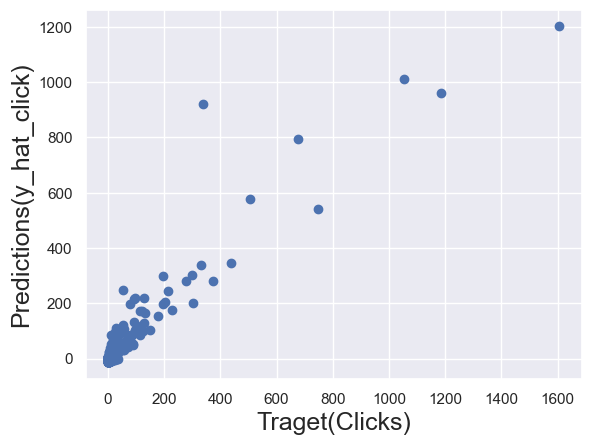

In [252]:
plt.scatter(y_click, y_hat_click)
plt.xlabel('Traget(Clicks)',size = 18)
plt.ylabel('Predictions(y_hat_click)',size = 18)
plt.show()

C:\Users\NIGHAT\AppData\Local\Temp\ipykernel_18292\863232373.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(y_click - y_hat_click)


Text(0.5, 1.0, 'Residual PDF')

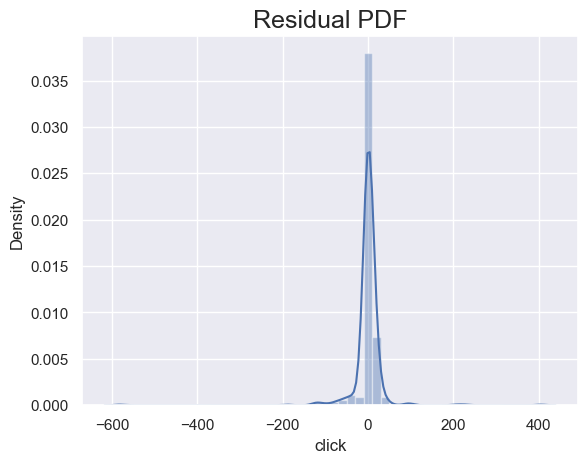

In [223]:
sns.distplot(y_click - y_hat_click)
plt.title("Residual PDF", size=18)

In [226]:
reg_click.score(x_click,y_click)

0.8857812997995548

In [228]:
reg_click.intercept_

-14.25644302821495

In [227]:
reg_click.coef_

array([ 1.32148963e-02,  7.89628243e-01,  9.07642222e+00,  2.47250448e+01,
        1.19923636e+01,  1.72477788e+01,  2.65594949e+00,  1.37895895e+01,
        8.41112675e+00,  1.09574882e+01,  1.77765932e+01,  1.16713111e+01,
        1.50053600e+01,  8.24388376e+00,  1.62256811e+01,  1.84767641e+01,
        5.08140996e+00,  2.22699236e+00,  7.93539048e+00,  1.29219570e+01,
        1.54548850e+01,  1.47939217e+01, -3.74093448e+00,  1.57278472e+01,
        1.11732586e+01,  3.34728691e+01,  1.07765932e+01,  1.51110792e+01,
        9.12039903e+00,  1.63667129e+01,  1.29041915e+01, -3.73725798e+00,
        8.79435874e+00, -1.33321438e+02,  1.59128557e+01,  1.67278472e+01,
       -3.41143624e+00,  1.04024625e+01,  1.40538875e+01,  1.47807068e+01,
        1.01026335e+01,  2.44152403e+01,  1.49878130e+01,  1.60673209e+01,
        2.87844220e+01,  1.29483868e+01,  1.69000779e+01,  1.32477788e+01,
        1.54503344e+01,  1.19483868e+01,  1.68203515e+01,  9.90007791e+00,
        1.68030230e+01,  

In [229]:
reg_summary_click= pd.DataFrame(x_click.columns.values, columns=["Features"])
reg_summary_click["Weights"] = reg_click.coef_
reg_summary_click

# ADILABAD is the Benchmark for the District

,Features,Weights
0,impression,0.013215
1,district_AGRA,0.789628
2,district_AHMED NAGAR,9.076422
3,district_AJMER,24.725045
4,district_ALAPPUZHA,11.992364
5,district_ALIGARH,17.247779
6,district_ALLAHABAD,2.655949
7,district_ALMORA,13.789590
8,district_AMBEDKAR NAGAR,8.411127
9,district_AMRAVATI,10.957488


In [230]:
#Mean Squared Error
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(y_click, y_hat_click)
mse

1638.1141578053634

In [231]:
df_pf_click = pd.DataFrame(y_hat_click, columns = ["Prediction"])
df_pf_click.head()

,Prediction
0,-12.551721
1,49.000000
2,3.000000
3,1201.725454
4,30.713849


In [247]:
y_click.reset_index(drop=True)
df_pf_click = df_pf_click.drop(['Targets'], axis=1)

In [248]:
df_pf_click['Targets'] = y_click
df_pf_click

,Prediction,Targets
0,-12.551721,1
1,49.000000,49
2,3.000000,3
3,1201.725454,1606
4,30.713849,31
5,33.000000,33
6,1.000000,1
7,5.000000,5
8,30.000000,30
9,1.000000,1


In [249]:
df_pf_click['Residual'] = df_pf_click['Targets'] - df_pf_click['Prediction']
df_pf_click

,Prediction,Targets,Residual
0,-12.551721,1,13.551721
1,49.000000,49,0.000000
2,3.000000,3,-0.000000
3,1201.725454,1606,404.274546
4,30.713849,31,0.286151
5,33.000000,33,-0.000000
6,1.000000,1,-0.000000
7,5.000000,5,-0.000000
8,30.000000,30,0.000000
9,1.000000,1,-0.000000


In [253]:
df_pf_click['Difference%'] = np.absolute(df_pf_click['Residual']/df_pf_click['Targets']*100)
df_pf_click.sort_values(by=['Difference%']).reset_index(drop=True)

,Prediction,Targets,Residual,Difference%
0,33.000000,33,0.000000,0.000000
1,30.000000,30,0.000000,0.000000
2,66.000000,66,0.000000,0.000000
3,18.000000,18,-0.000000,0.000000
4,26.000000,26,-0.000000,0.000000
5,55.000000,55,-0.000000,0.000000
6,57.000000,57,-0.000000,0.000000
7,21.000000,21,-0.000000,0.000000
8,116.000000,116,0.000000,0.000000
9,41.000000,41,-0.000000,0.000000


## F- Test and p-value for Ad Clicks

In [254]:
from sklearn.feature_selection import f_regression
f_regression(x_click, y_click)

(array([2.79391711e+03, 2.27845528e-02, 5.41962804e-02, 3.05222400e-04,
        6.22441416e-02, 4.67054844e-02, 5.70825850e-05, 6.22441416e-02,
        6.22441416e-02, 4.67054844e-02, 3.65136807e-02, 3.65136807e-02,
        6.22441416e-02, 5.41962804e-02, 5.41962804e-02, 4.67054844e-02,
        3.97717042e-02, 3.97717042e-02, 6.22441416e-02, 5.41962804e-02,
        5.03812524e-02, 6.22441416e-02, 1.15907139e-02, 5.81505747e-02,
        5.03812524e-02, 1.06153765e-03, 6.22441416e-02, 6.22441416e-02,
        5.81505747e-02, 5.03812524e-02, 6.22441416e-02, 3.65136807e-02,
        6.22441416e-02, 4.34932040e-03, 5.81505747e-02, 5.41962804e-02,
        4.31689703e-02, 4.67054844e-02, 6.22441416e-02, 6.22441416e-02,
        6.22441416e-02, 2.23120201e-02, 5.81505747e-02, 4.31689703e-02,
        8.57203529e-02, 5.41962804e-02, 3.33948942e-02, 6.22441416e-02,
        5.81505747e-02, 5.81505747e-02, 5.41962804e-02, 5.81505747e-02,
        3.97717042e-02, 5.41962804e-02, 5.41962804e-02, 6.224414

In [256]:
p_values_click = f_regression(x_click, y_click)[1]
f_statistic_click= f_regression(x_click, y_click)[0]

In [257]:
reg_summary_click['p-values'] = p_values_click.round(6)
reg_summary_click['f-statistic'] = f_statistic_click.round(6)
reg_summary_click.sort_values(by=['p-values']).reset_index(drop=True)


,Features,Weights,p-values,f-statistic
0,impression,0.013215,0.000000,2793.917114
1,district_PURI,4.624430,0.148536,2.093594
2,district_KANPUR NAGAR,27.833682,0.165691,1.927056
3,district_VARANASI,21.260853,0.418043,0.656882
4,district_SIKAR,61.274684,0.477902,0.504394
5,district_MUMBAI,-295.419213,0.616287,0.251431
6,district_CENTRAL DELHI,-389.800439,0.651935,0.203711
7,district_RANCHI,-6.066936,0.706905,0.141547
8,district_BILASPURCGH,28.784422,0.769810,0.085720
9,district_GONDA,14.727847,0.803085,0.062244


In [258]:
reg_summary_filtered_1 = reg_summary_click[reg_summary_click['Weights'] > 0]

In [260]:
reg_summary_filtered_1.sort_values(by=['p-values']).reset_index(drop=True)

# Features having p-values>0.05 are not statistically significant which means that the observed relationship between that 
# predictor and the response variable is unlikely to have occurred by random chance. 
#In other words, the effect of that predictor on the response variable is not likely to be real or just a fluke.

,Features,Weights,p-values,f-statistic
0,impression,0.013215,0.000000,2793.917114
1,district_PURI,4.624430,0.148536,2.093594
2,district_KANPUR NAGAR,27.833682,0.165691,1.927056
3,district_VARANASI,21.260853,0.418043,0.656882
4,district_SIKAR,61.274684,0.477902,0.504394
5,district_BILASPURCGH,28.784422,0.769810,0.085720
6,district_NAGAPATTINAM,13.221349,0.803085,0.062244
7,district_Mammit,15.111079,0.803085,0.062244
8,district_MORENA,14.780707,0.803085,0.062244
9,district_KOPPAL,12.335951,0.803085,0.062244
